In [1]:
import os, sys, glob

import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans;

In [2]:


def get_median_pixels(img_dir):
    images = glob.glob(f"{img_dir}/*.jpg")
    image_arrays = [cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2GRAY) for image in images]
    pixel_medians = np.median(image_arrays, axis=0).astype(np.uint8)
    return pixel_medians

median_img = get_median_pixels("train/Task2")

In [25]:
def find_flags(path):
    image = cv2.imread(path)
    # Convert the image to HSV
    hsv_image = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # Define the color range for red, white, and blue in HSV
    # lower_red = np.array([0, 50, 50])
    # upper_red = np.array([10, 255, 255])

    # lower_white = np.array([100, 0, 200])
    # upper_white = np.array([180, 50, 255])

    lower_blue = np.array([110, 50, 50])
    upper_blue = np.array([130, 255, 255])

    # red_mask = cv2.inRange(hsv_image, lower_red, upper_red)

    blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)

    british_flag_mask = blue_mask#cv2.bitwise_or(red_mask, blue_mask)#cv2.bitwise_or(red_mask, cv2.bitwise_or(white_mask, blue_mask))

    kernel_size = 31  # Adjust the size according to your requirements
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # british_flag_mask = cv2.morphologyEx(british_flag_mask, cv2.MORPH_OPEN, kernel=np.ones((5, 5), dtype=np.uint8))
    british_flag_mask = cv2.dilate(british_flag_mask, kernel, iterations=3)
    british_flag_mask = cv2.erode(british_flag_mask, kernel, iterations=3)

    contours, _ = cv2.findContours(british_flag_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # plt.figure(figsize=(15,15))
    # plt.imshow(british_flag_mask)
    # plt.show()


    arrow_flags = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if len(arrow_flags)>2 or area<10_000:
            continue
        arrow_flags.append(cv2.boundingRect(contour))
    return arrow_flags


def remove_points_inside_boxes(contours, bound_rects):
    filtered_contours = []
    for contour in contours:
        points_inside = []
        for point in contour:
            is_inside = False
            for rect in bound_rects:
                x, y, w, h = rect
                if x <= point[0][0] <= x + w and y <= point[0][1] <= y + h:
                    is_inside = True
                    break
            if not is_inside:
                points_inside.append(point)
        if len(points_inside) > 0:
            filtered_contours.append(np.array(points_inside))
    return filtered_contours


[(1916, 1507, 353, 395), (1378, 962, 394, 332)]
54
2


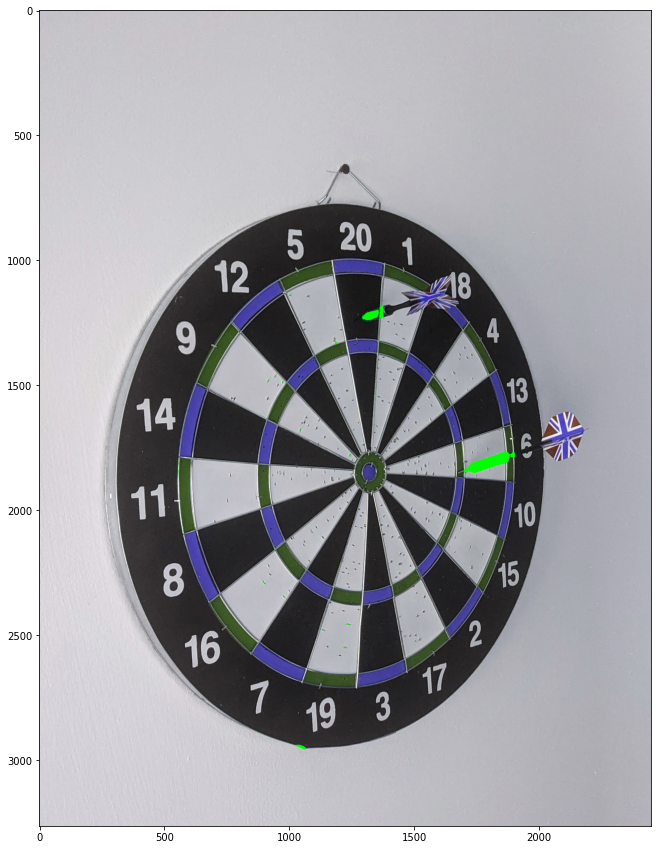

[(1321, 1832, 388, 421)]
23
1


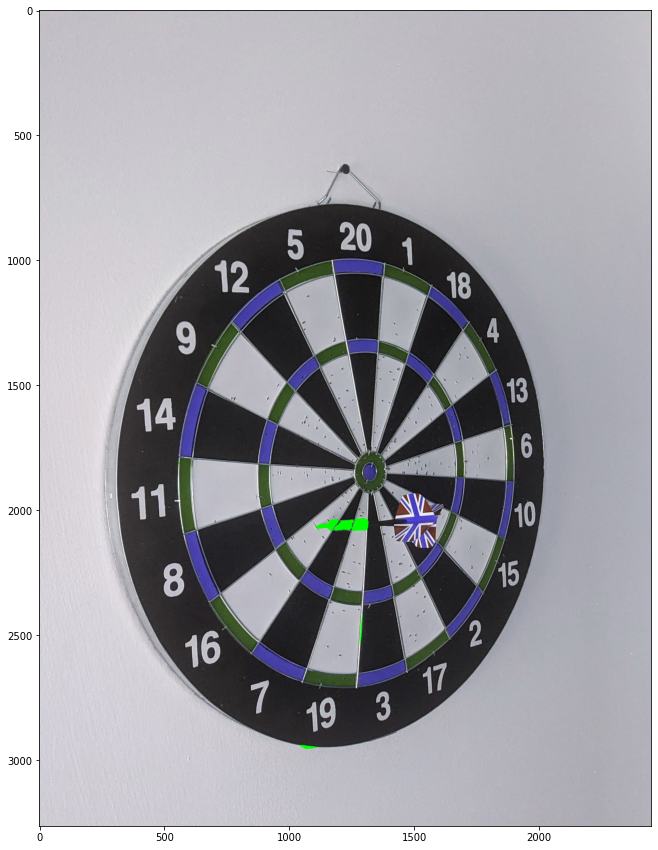

[(931, 1400, 409, 459), (1657, 742, 392, 403)]
59
2


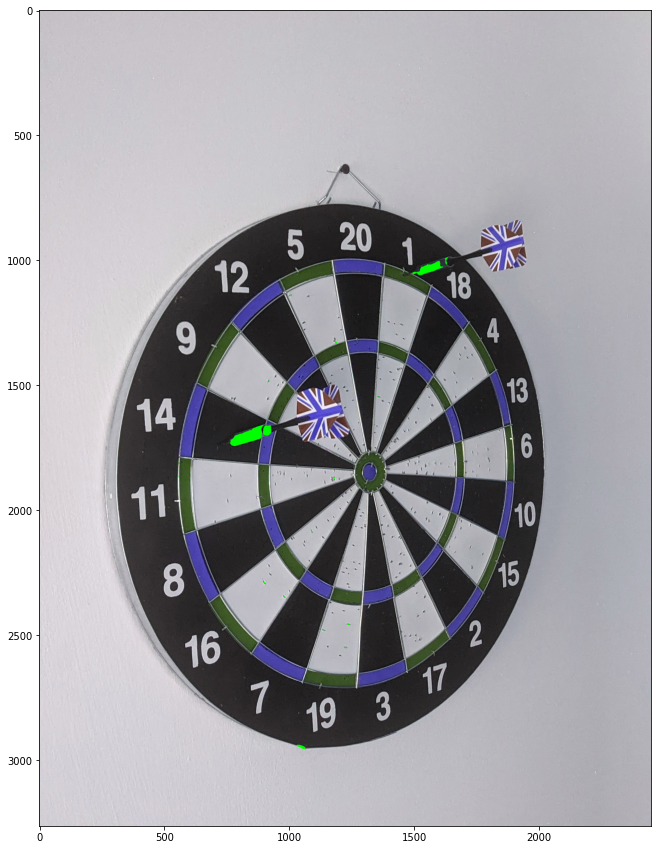

[(1516, 2244, 364, 396), (1763, 1219, 397, 402)]
43
2


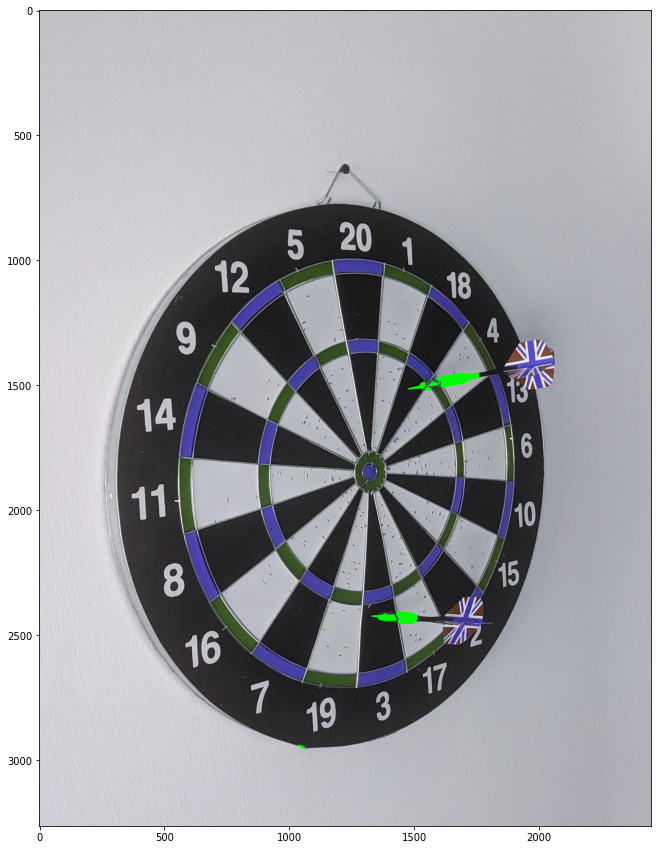

[(1942, 1661, 344, 362), (1107, 1517, 389, 437), (1487, 1044, 404, 421)]
107
3


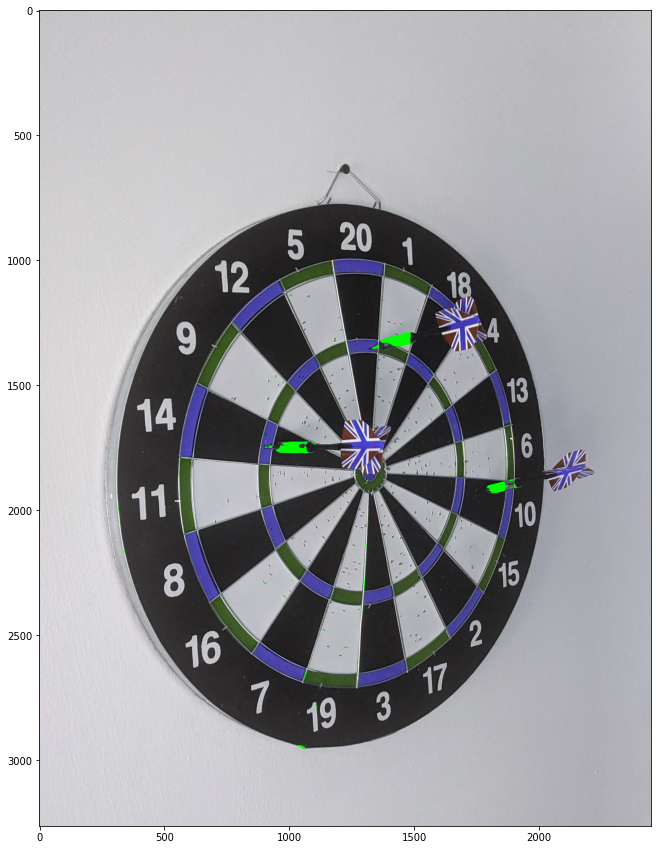

[(1043, 1569, 369, 440), (1442, 931, 417, 369)]
413
2


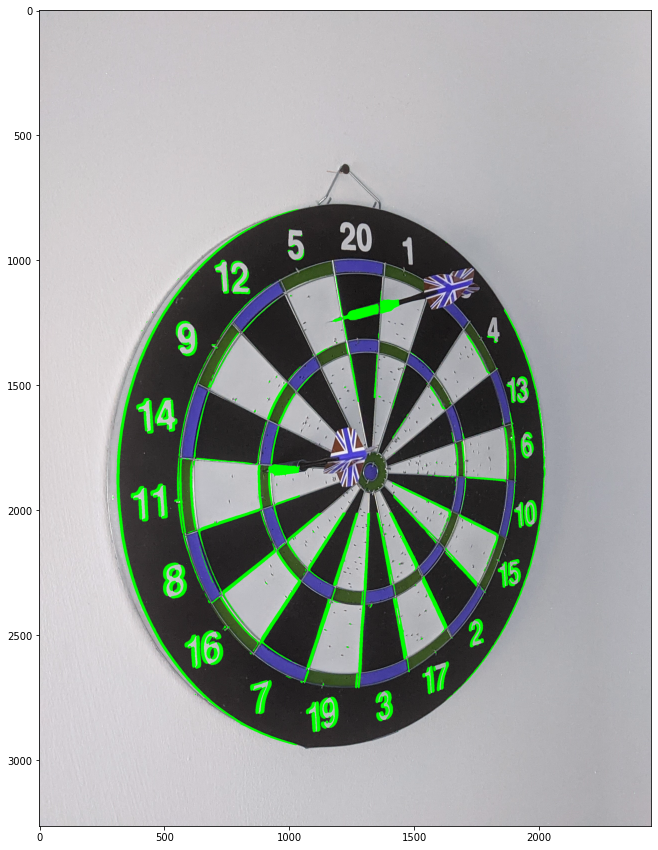

[(1793, 1958, 363, 399), (1176, 1529, 372, 416), (1916, 1506, 353, 394)]
95
3


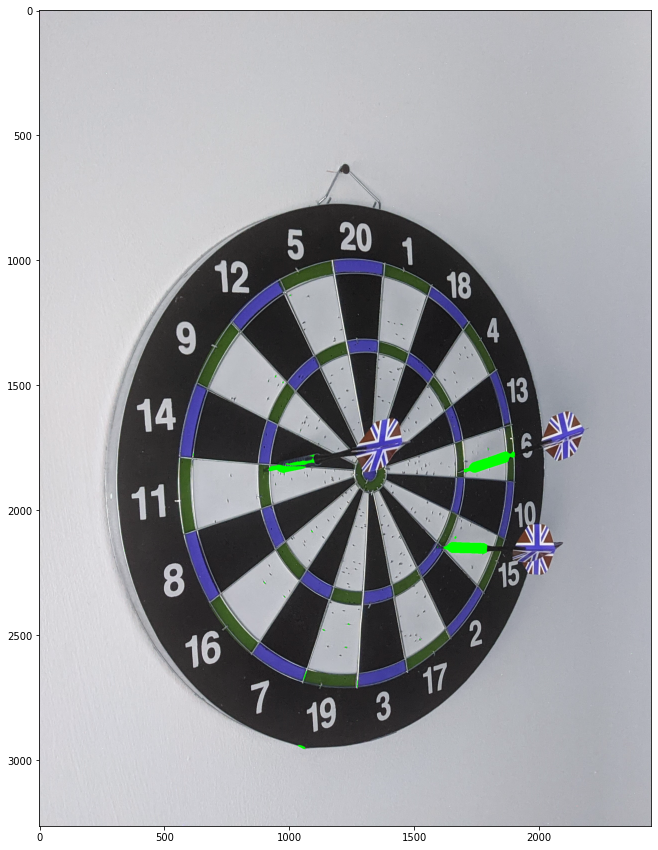

[(1455, 2087, 388, 414), (1110, 1307, 431, 329)]
143
2


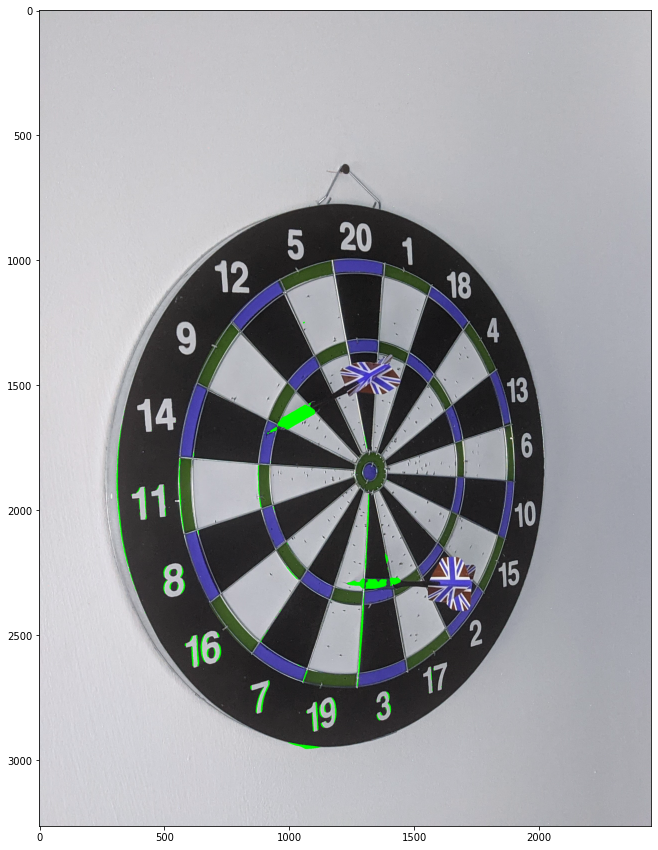

[(1557, 2302, 348, 422), (1481, 1658, 365, 389)]
204
2


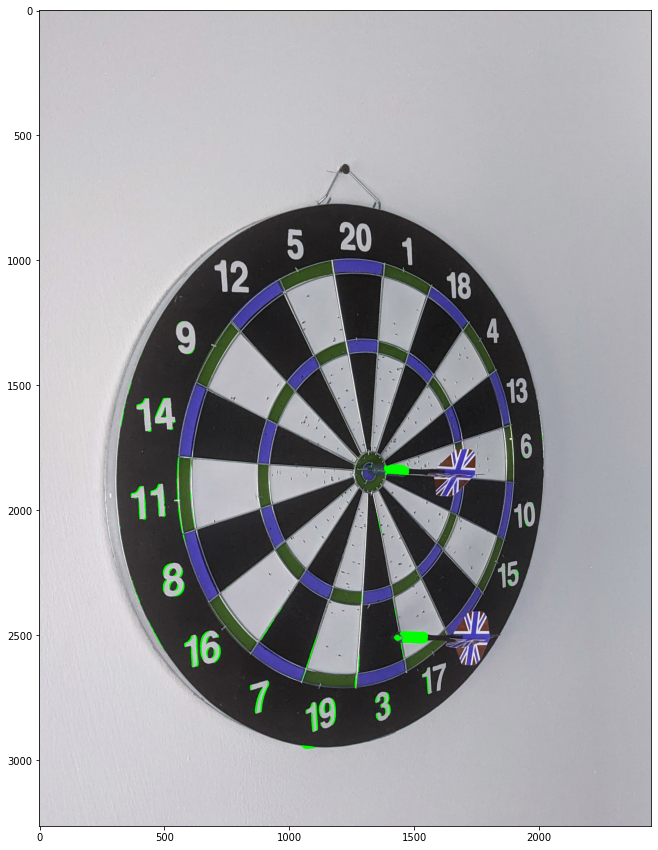

[(1283, 1871, 384, 396), (2123, 1695, 425, 314), (1864, 1442, 385, 397)]
437
3


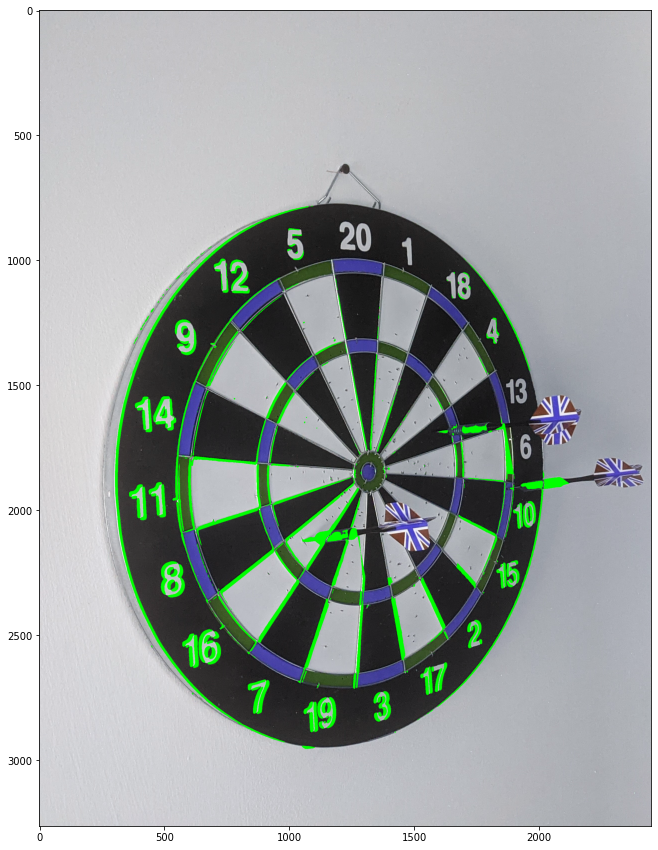

[(1810, 1746, 397, 335), (1180, 1321, 374, 407), (1594, 952, 367, 392)]
169
3


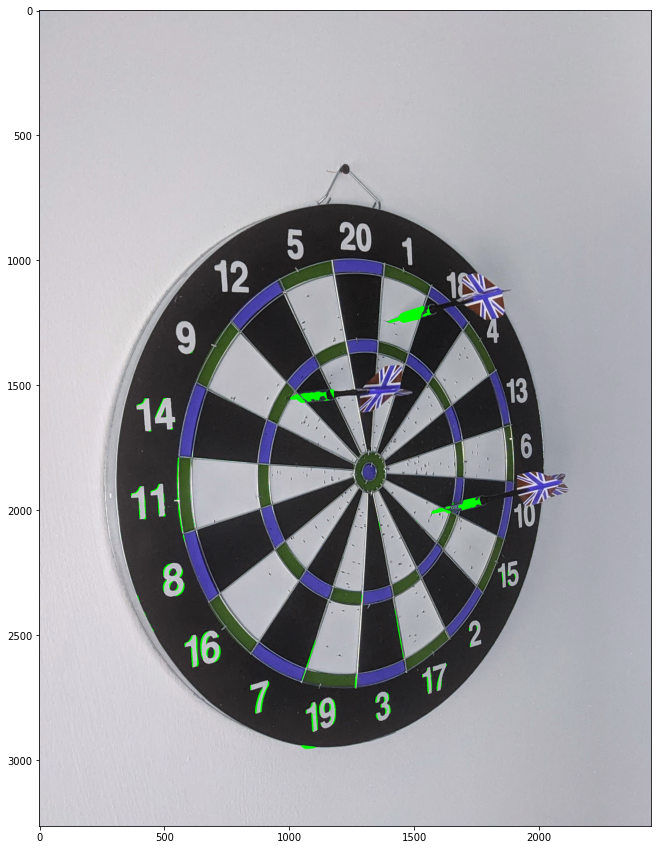

[(1701, 1929, 368, 406), (1264, 1124, 421, 431)]
107
2


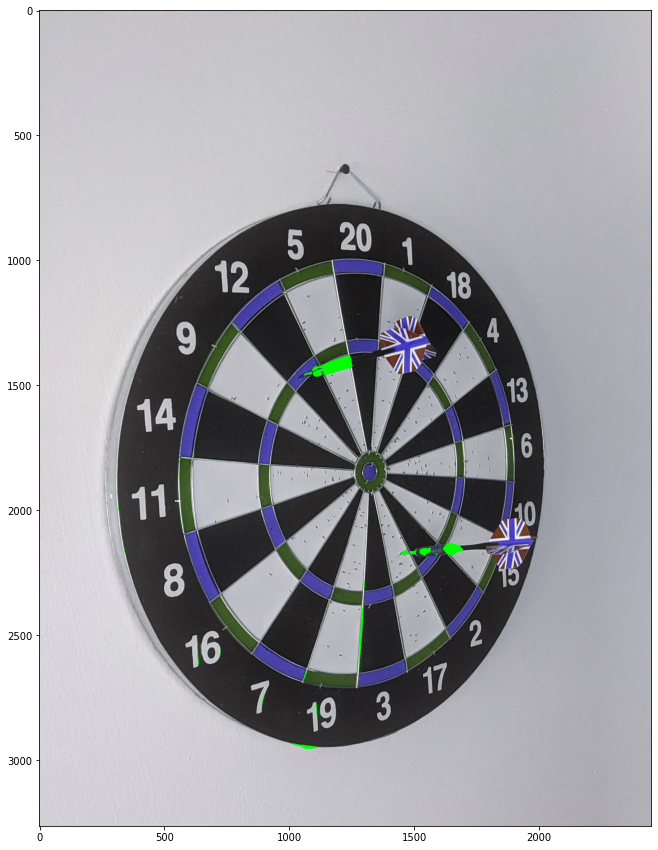

[(1905, 1279, 391, 339), (1158, 1189, 360, 424)]
279
2


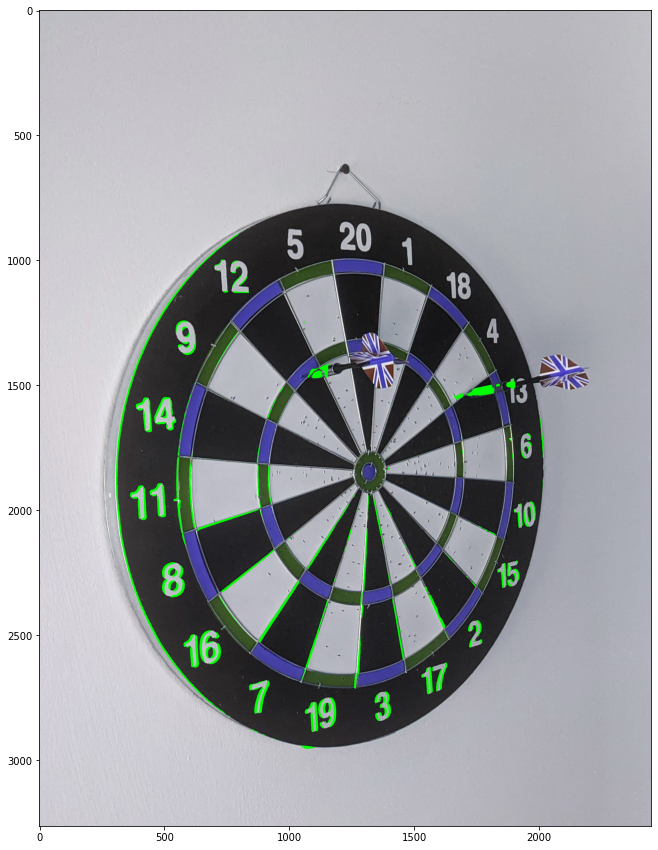

[(2020, 1539, 399, 388), (1527, 1024, 401, 398)]
51
2


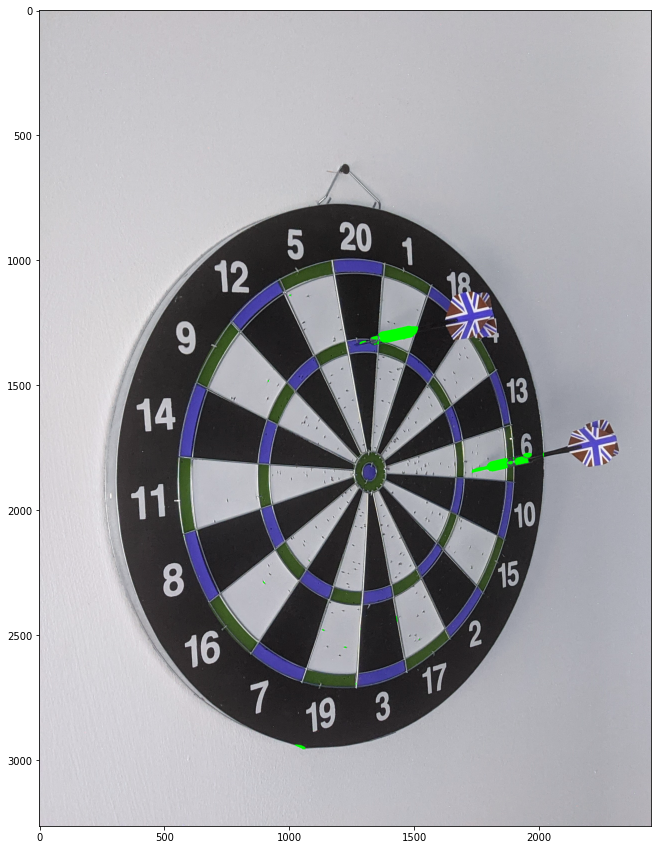

[(1867, 1300, 396, 333)]
342
1


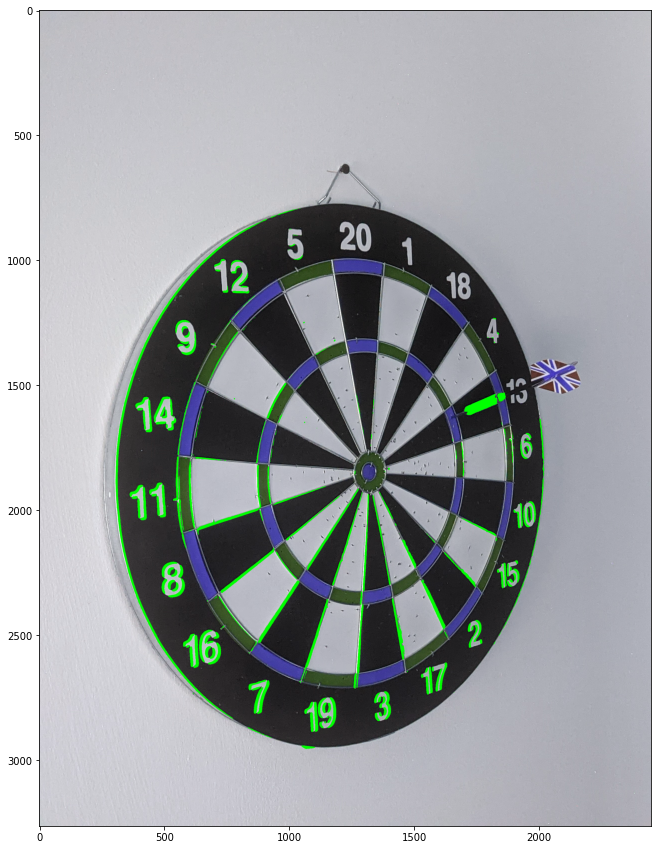

[(769, 1364, 434, 388)]
204
1


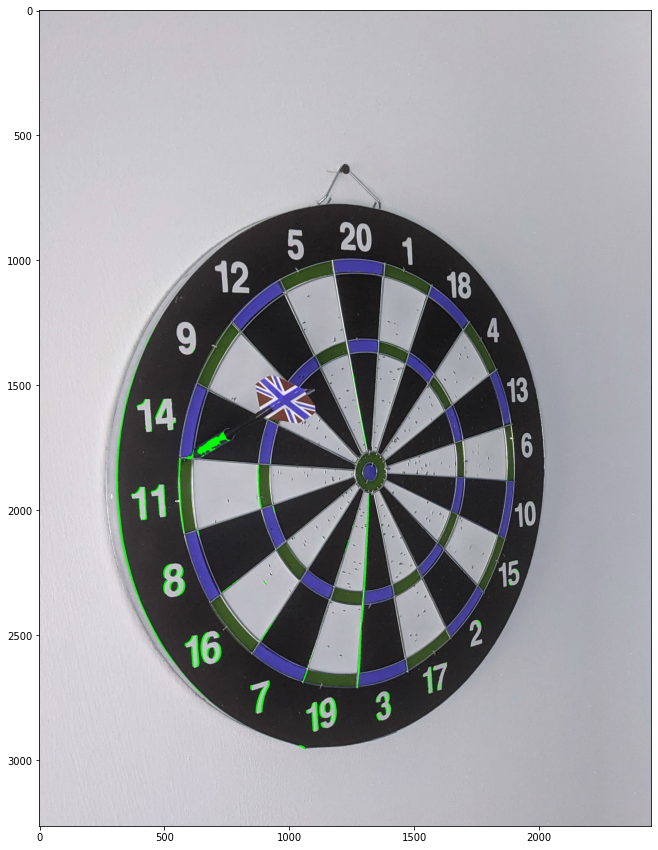

[(1388, 2061, 403, 422)]
126
1


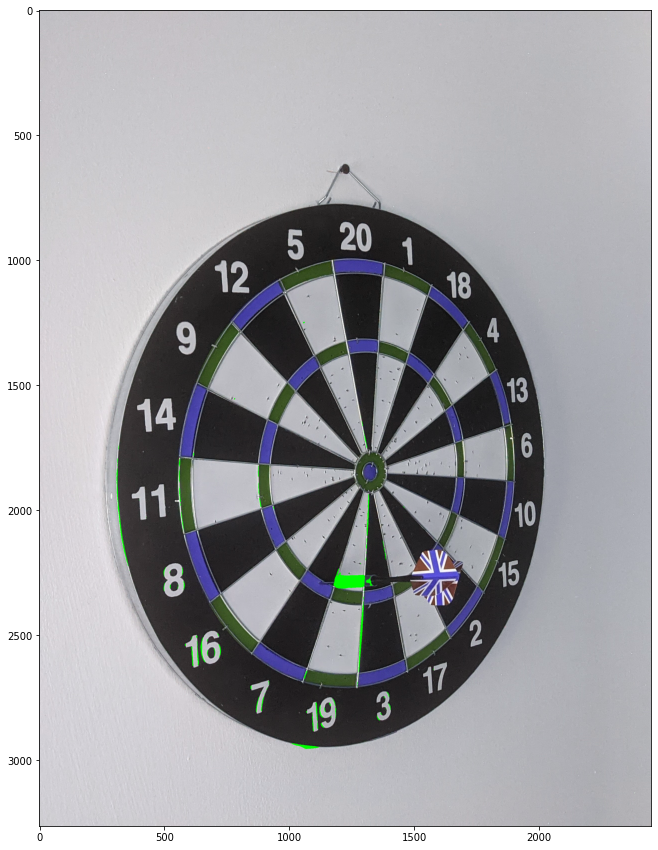

[(1693, 1117, 393, 409)]
36
1


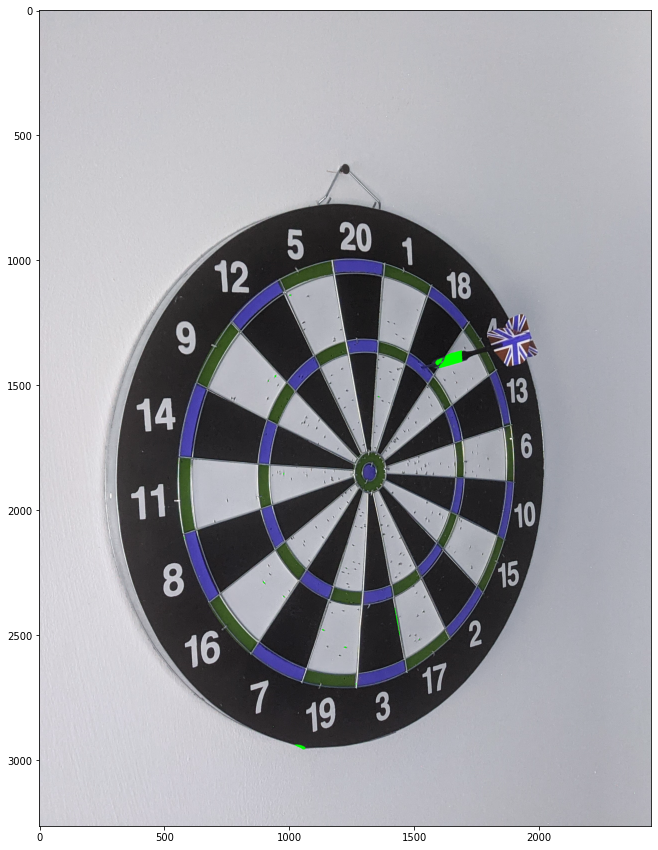

[(1744, 2280, 370, 396)]
439
1


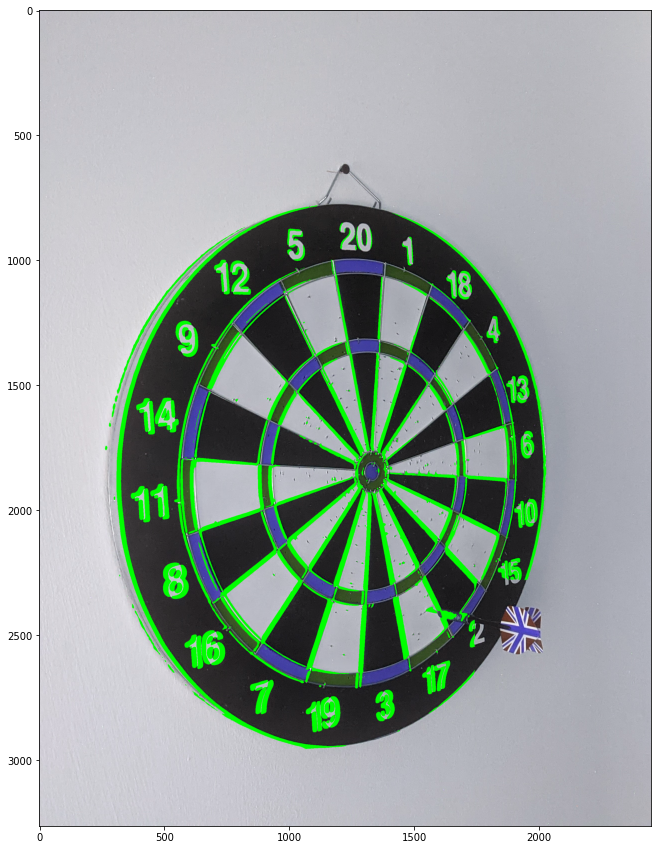

[(1625, 1811, 379, 402), (1972, 1446, 395, 396), (1358, 1010, 371, 414)]
290
3


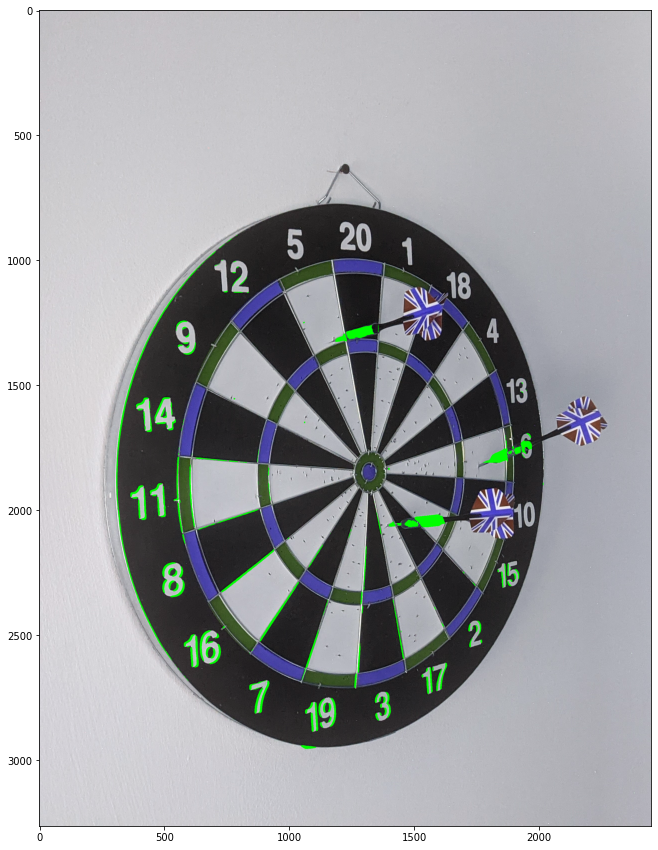

[(1689, 2161, 391, 404), (1363, 1206, 316, 425)]
49
2


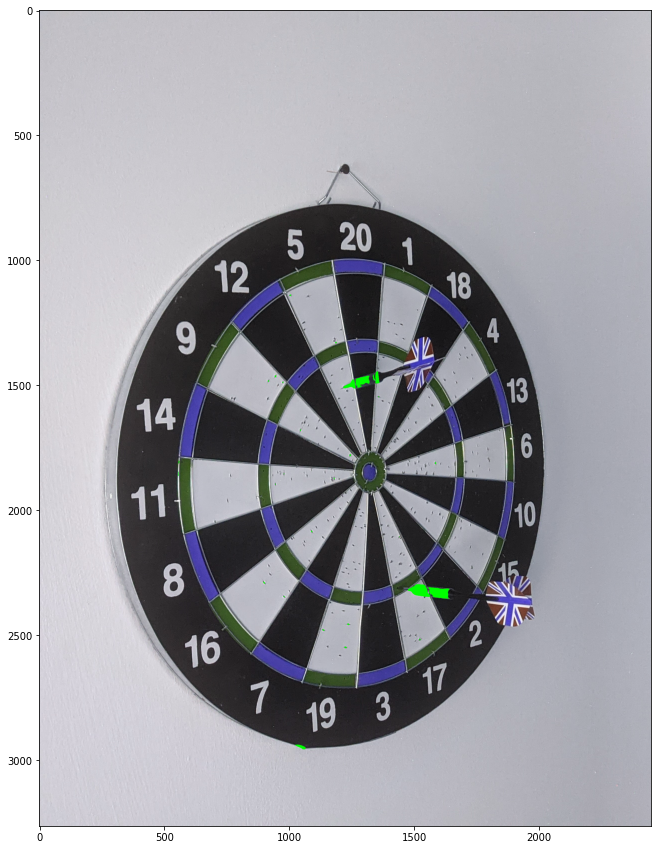

[(1920, 1886, 384, 368), (1164, 1240, 394, 422), (1697, 1117, 390, 409)]
65
3


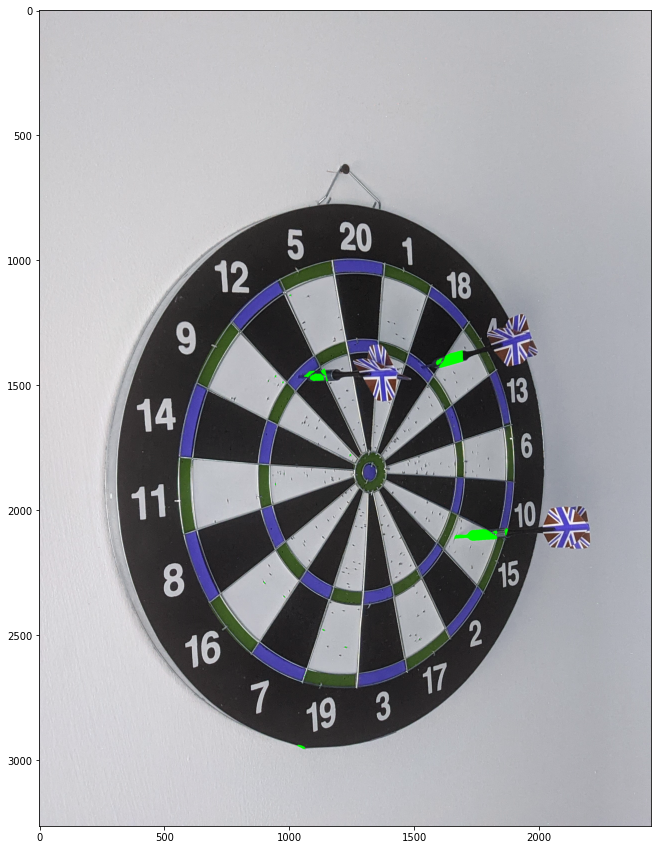

[(925, 1828, 409, 420), (1771, 1820, 394, 323), (1498, 995, 348, 417)]
97
3


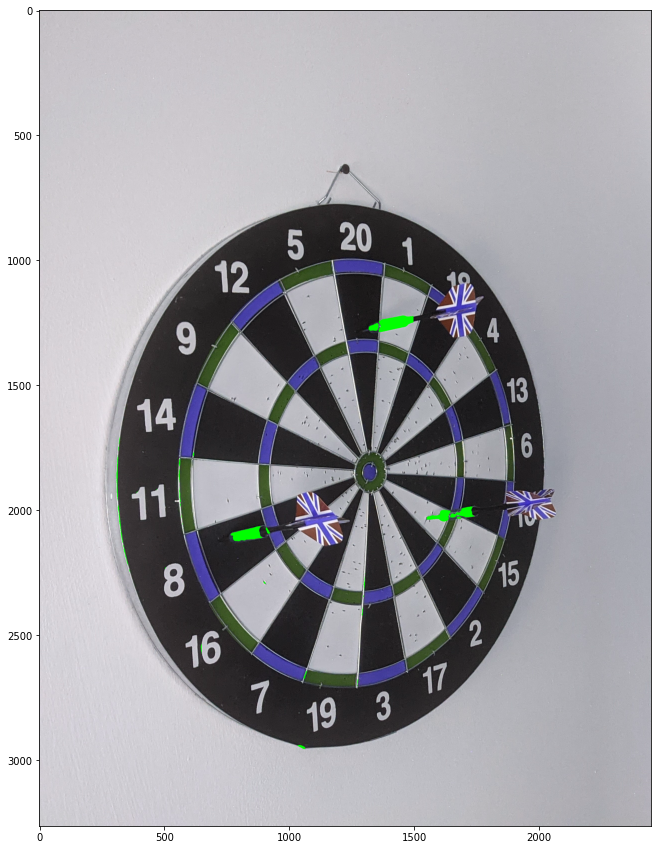

[(1377, 2213, 324, 411), (1792, 1257, 374, 374)]
88
2


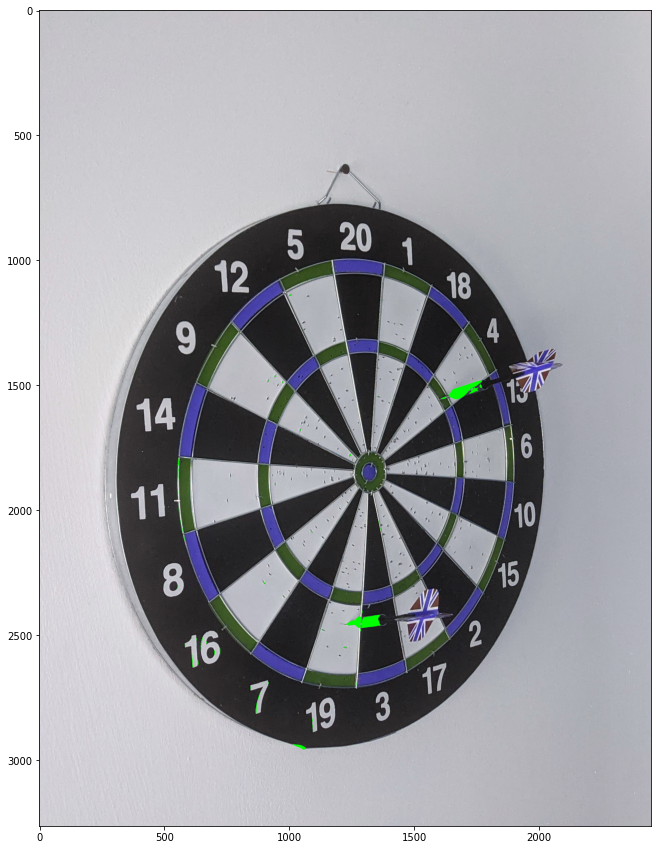

[(1929, 987, 398, 400)]
128
1


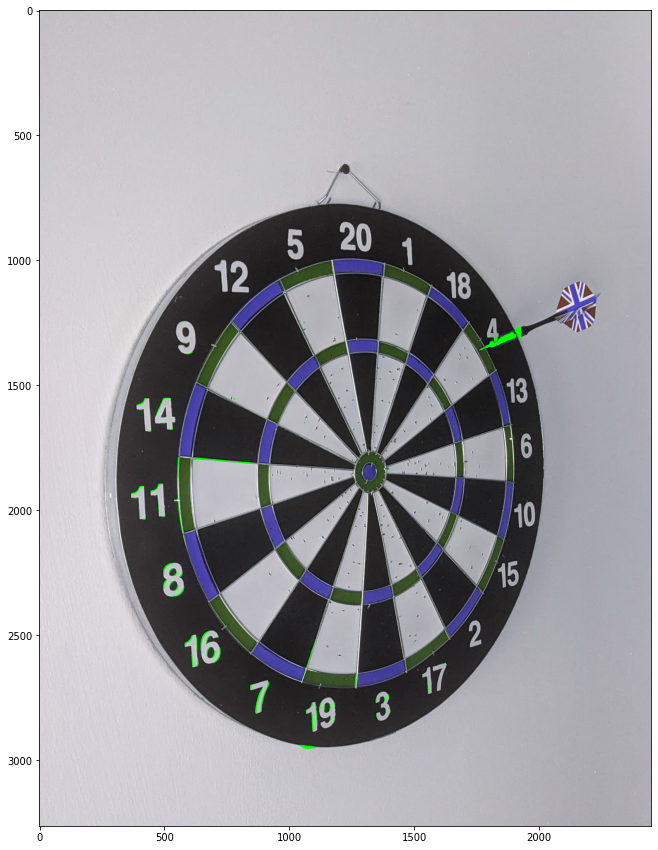

In [28]:

def compute_new_objects(current_image, background):
    current_gray = cv2.cvtColor(current_image, cv2.COLOR_BGR2GRAY)
    current_gray = cv2.GaussianBlur(current_gray, (21, 21), 0)
    background = cv2.GaussianBlur(background, (21, 21), 0)
    diff = cv2.absdiff(current_gray, background)


    _, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
    # mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel=np.ones((5, 5), dtype=np.uint8))

    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    
    return contours, hierarchy

for i in range(1,26):
    path = f'train/Task2/{ "0" + str(i) if i<10 else i}.jpg'
    flags = find_flags(path)
    img = cv2.imread(path)
    
    board_mask = cv2.imread("train/board_mask_task2.png")[:,:, 1]
    board_mask = 1 * (board_mask == 255)


    contours, hierarchy = compute_new_objects(img, median_img)
    

    flags = find_flags(path)
    n_clusters = len(flags)

    flags = [ (x-100, y-100, w+200, h+200) for (x,y,w,h) in flags ]
    print(flags)
    print(len(contours))

    contours = remove_points_inside_boxes(contours, flags)

    # contours = [contour for contour in contours if cv2.contourArea(contour) > 100 ]
    # contours = [contour for contour in contours if cv2.boundingRect(contour)[3]< 400]
    #  
    # contours = [contour for contour in contours if len(contour) > 100 ]

    # for contour in contours:
    #     print(len(contour))
    # contours = sorted(contours, reverse=True, key=lambda x: cv2.contourArea(x))[:n_clusters]
    
    # clustered_contours = cluster_contours(contours, n_clusters)


    cv2.drawContours(img, contours, -1, (0, 255, 0), -1)
    print(len(flags))
    plt.figure(figsize=(15,15))
    plt.imshow(img)
    plt.show()

In [30]:
cv2.imwrite("mask_task2.png", median_img)

True

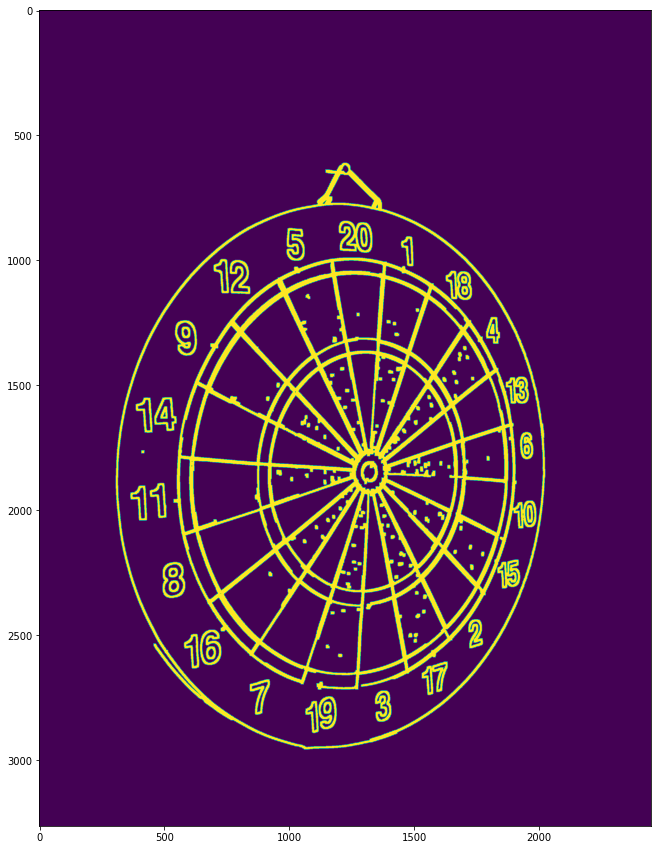

In [16]:
grayscale_image = median_img.copy() #cv2.cvtColor(median_img, cv2.COLOR_BGR2GRAY)
blurred_image = cv2.GaussianBlur(grayscale_image, (5, 5), 0)

# Find contours in the image
kernel = np.ones((9,9), np.uint8)
median_contours = cv2.Canny(blurred_image, 70, 200)
median_contours = cv2.dilate(median_contours, kernel)

plt.figure(figsize=(15,15))
plt.imshow(median_contours)
plt.show()


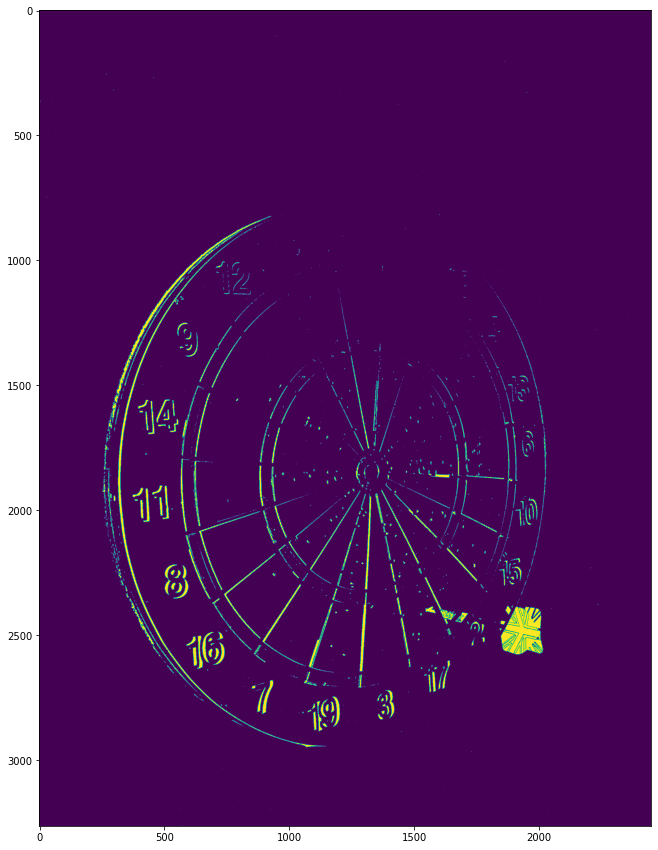

In [17]:
filtered = cv2.bitwise_and(~median_contours, contours)
plt.figure(figsize=(15,15))
plt.imshow(filtered)
plt.show()

In [18]:
np.unique(filtered, return_counts=True)

(array([  0, 255], dtype=uint8), array([7822275,  167997], dtype=int64))

In [81]:
img = cv2.imread("train/board_mask_task2.png")[:,:, 1]
img = 1 * (img == 255)


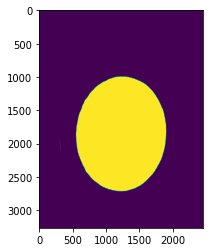

In [82]:
plt.imshow(img)

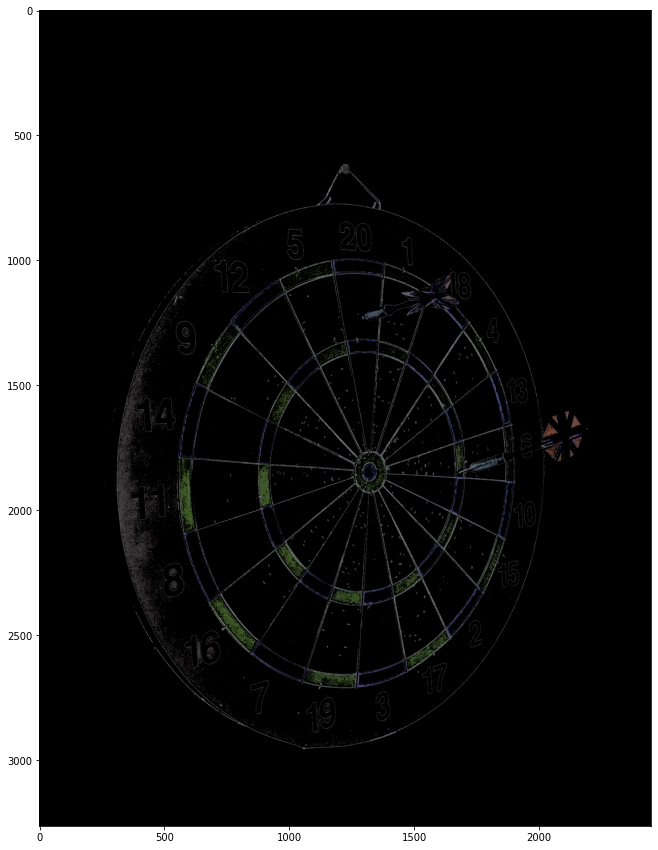

In [92]:
def filter_pixels_by_rgb_range(image, lower_range, upper_range):
    # Convert the image to the BGR color space (since OpenCV uses BGR order)
    bgr_image = image.copy()

    # Create a mask for pixels within the specified RGB range
    mask = cv2.inRange(bgr_image, lower_range, upper_range)

    # Apply the mask to the image to filter out pixels outside the range
    filtered_image = cv2.bitwise_and(bgr_image, bgr_image, mask=mask)

    return filtered_image

img = cv2.imread("train/Task2/01.jpg")
# lower = np.array([76, 61, 47])
# upper = np.array([147, 140, 134])

lower = np.array([56, 41, 37])
upper = np.array([147, 140, 134])

filtered = filter_pixels_by_rgb_range(img, lower, upper)

plt.figure(figsize=(15,15))
plt.imshow(filtered)
plt.show()

In [86]:
img = cv2.imread("train/Task2/01.jpg")